In [130]:
# задаю класс для стилизации вывода метода .print()
#class color:
 #  PURPLE = '\033[95m'
 #  CYAN = '\033[96m'
 #  DARKCYAN = '\033[36m'
  # BLUE = '\033[94m'
  # GREEN = '\033[92m'
  # YELLOW = '\033[93m'
  # RED = '\033[91m'
   #BOLD = '\033[1m'
#   UNDERLINE = '\033[4m'
#   END = '\033[0m'

In [131]:
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import phik
import numpy as np

from ydata_profiling import ProfileReport

from sklearn.model_selection import GridSearchCV, StratifiedKFold, RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier 
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
import catboost as cb
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
import lime
import lime.lime_tabular
import shap

from sklearn.metrics import f1_score
RANDOM_STATE = 100

## Загрузка данных

### Тестовые данные

In [132]:
startups_test= pd.read_csv('datasets/kaggle_startups_test_28062024.csv', sep=',', low_memory=False)
df_test = startups_test.copy()
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               13125 non-null  object 
 1   category_list      12534 non-null  object 
 2   funding_total_usd  10547 non-null  float64
 3   country_code       11743 non-null  object 
 4   state_code         11430 non-null  object 
 5   region             11536 non-null  object 
 6   city               11538 non-null  object 
 7   funding_rounds     13125 non-null  int64  
 8   first_funding_at   13125 non-null  object 
 9   last_funding_at    13125 non-null  object 
 10  lifetime           13125 non-null  int64  
dtypes: float64(1), int64(2), object(8)
memory usage: 1.1+ MB


In [133]:
df_test.describe()

,funding_total_usd,funding_rounds,lifetime
count,"10,547.00","13,125.00","13,125.00"
mean,"16,549,102.70",1.71,"3,097.61"
std,"92,172,825.63",1.32,"2,128.36"
min,1.00,1.00,52.00
25%,"320,000.00",1.00,"1,726.00"
50%,"2,000,000.00",1.00,"2,526.00"
75%,"10,000,000.00",2.00,"3,866.00"
max,"4,715,000,000.00",15.00,"17,167.00"


In [134]:
df_test.sample()

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime
1738,Linc Global,Big Data|E-Commerce|Information Technology|Mac...,NaN,USA,CA,SF Bay Area,Sunnyvale,2,2014-01-01,2014-07-01,1826


In [135]:
df_test.duplicated(subset=['name']).sum()

0

### Тренировочная выборка

In [136]:
kaggle_startups_train= pd.read_csv('datasets/kaggle_startups_train_28062024.csv', sep=',', low_memory=False)
df_train = kaggle_startups_train.copy()
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               52515 non-null  object 
 1   category_list      50051 non-null  object 
 2   funding_total_usd  42447 non-null  float64
 3   status             52516 non-null  object 
 4   country_code       47014 non-null  object 
 5   state_code         45753 non-null  object 
 6   region             46157 non-null  object 
 7   city               46157 non-null  object 
 8   funding_rounds     52516 non-null  int64  
 9   founded_at         52516 non-null  object 
 10  first_funding_at   52516 non-null  object 
 11  last_funding_at    52516 non-null  object 
 12  closed_at          4917 non-null   object 
dtypes: float64(1), int64(1), object(11)
memory usage: 5.2+ MB


In [137]:
df_train.sample()

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
12230,TextbookTime.com Textbook Time,Colleges|E-Commerce|Textbooks,"50,000.00",operating,USA,UT,Salt Lake City,Sandy,1,2010-09-04,2010-09-01,2010-09-01,NaN


In [138]:
df_train.describe()

,funding_total_usd,funding_rounds
count,"42,447.00","52,516.00"
mean,"18,247,480.66",1.74
std,"187,117,301.32",1.37
min,1.00,1.00
25%,"336,027.50",1.00
50%,"2,000,000.00",1.00
75%,"10,000,000.00",2.00
max,"30,079,503,000.00",19.00


In [139]:
df_train.duplicated(subset=['name']).sum()

0

### Общий вывод по итогам выгрузки

Тренировочная и тестовая выбрки успешно загружены. \
В тренировочной выборке 52516 строк, есть пропуски. У столбцов founded_at, closed_at, first_funding_at, last_funding_at неверный тип данных \
В тестовой выборке 13125 строк, есть пропуски. Типы данных в столбцах first_funding_at, last_funding_at неверные.

В обоих датасетах в столбце category_list категории разделены вертикальной чертой. В дальнейшем следует ввести новый признак для категорий.

В тренировочной выборке отсутствует столбец lifetime, но есть столбцы founded_at, closed_at для его расчета (после заполнения пропусков). \

В поле с именем стартапа только уникальные значения.

## Предобработка данных

### Пропуски

Тренировочная выборка

Матрица пропусков для датаферйма df_train:



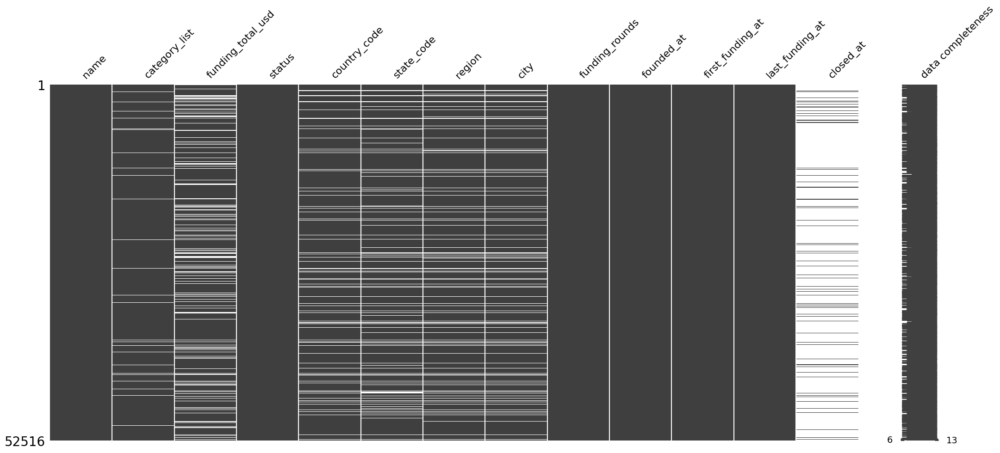

In [ ]:
# применияю библиотеку missingno для визуализации пропусков в датафрейме "df_train"
print('Матрица пропусков для датаферйма df_train:')
msno.matrix(df_train, labels=True)
pass

Тестовая выборка

Матрица пропусков для датаферйма df_train:



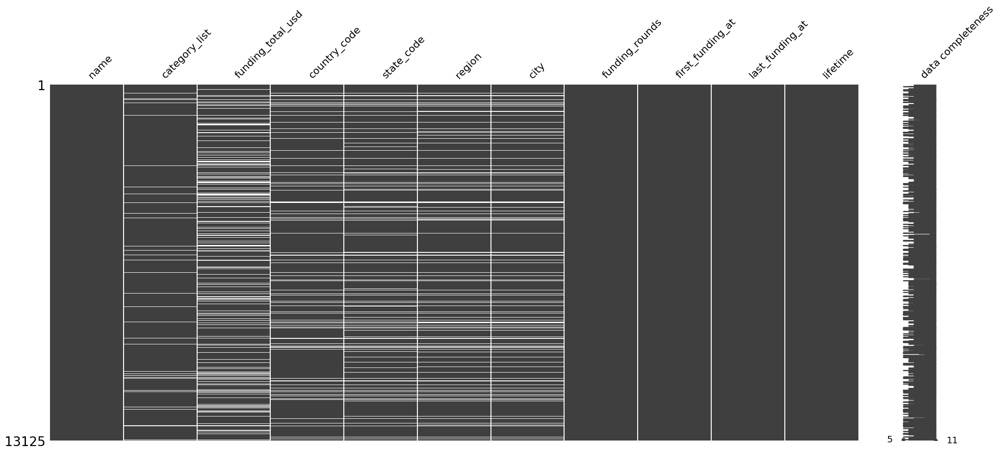

In [141]:
# применияю библиотеку missingno для визуализации пропусков в датафрейме "df_test"
print('Матрица пропусков для датаферйма df_train:''\n')
msno.matrix(df_test, labels=True)
pass

Данные, связанные с географической характеристикой (country_code, state_code, region и city) пропущены примерно в одних и тех же строках. \ 
Есть строки, где  заполнен регион, но не заполнен state_code. Сюда вошли страны небольшого размера (Сингапур, Мальта, ГонКонг и т.д.). \
Много пропущенных значений в столбце funding_total_usd. Будет некорректно заполнить это все нулями, поэтому заполним медианой для каждого круга финансирования.\

Пропущенные категориальные признаки заполним значением 'no_data', пропущенные даты в столбце closed_at заполним на '2018-01-01' (конец рассматриаемого диапазона).

In [142]:
# выполняю замену пропусков для df_train
df_train['name'] = df_train['name'].fillna('no_data')
df_train['category_list'] = df_train['category_list'].fillna('no_data')
df_train['country_code'] = df_train['country_code'].fillna('no_data')
df_train['state_code'] = df_train['state_code'].fillna('no_data')
df_train['region'] = df_train['region'].fillna('no_data')
df_train['city'] = df_train['city'].fillna('no_data')
df_train['closed_at'] = df_train['closed_at'].fillna('2018-01-01')

# выполняю замену пропусков для df_test
df_test['category_list'] = df_test['category_list'].fillna('no_data')
df_test['country_code'] = df_test['country_code'].fillna('no_data')
df_test['state_code'] = df_test['state_code'].fillna('no_data')
df_test['region'] = df_test['region'].fillna('no_df_tuple = (df_train, df_test)data')
df_test['city'] = df_test['city'].fillna('no_data')

for r in df_train['funding_rounds'].unique():
    df_train.loc[(df_train['funding_rounds'] == r) & (df_train['funding_total_usd'].isna()), 'funding_total_usd'] = \
    df_train.loc[(df_train['funding_rounds'] == r), 'funding_total_usd'].median()
    
for r in df_test['funding_rounds'].unique():
    df_test.loc[(df_test['funding_rounds'] == r) & (df_test['funding_total_usd'].isna()), 'funding_total_usd'] = \
    df_test.loc[(df_test['funding_rounds'] == r), 'funding_total_usd'].median()

Проверим, остались ли пропуски

In [143]:
# посчитаем долю пропусков в каждом столбце
pd.DataFrame(df_train.isna().mean()).sort_values(by = 0, ascending=False).style.format('{:.2%}').background_gradient('coolwarm')

,0
name,0.00%
category_list,0.00%
funding_total_usd,0.00%
status,0.00%
country_code,0.00%
state_code,0.00%
region,0.00%
city,0.00%
funding_rounds,0.00%
founded_at,0.00%


In [144]:
pd.DataFrame(df_test.isna().mean()).sort_values(by = 0, ascending=False).style.format('{:.2%}').background_gradient('coolwarm')

,0
name,0.00%
category_list,0.00%
funding_total_usd,0.00%
country_code,0.00%
state_code,0.00%
region,0.00%
city,0.00%
funding_rounds,0.00%
first_funding_at,0.00%
last_funding_at,0.00%


### Типы данных

В тренировочном дф founded_at, closed_at, first_funding_at, last_funding_at заменим тип данных на date. \
В тестовом заменим типы данных в first_funding_at, last_funding_at на date.

In [145]:
df_train['founded_at'] = pd.to_datetime(df_train['founded_at'], format='%Y-%m-%d')
df_train['closed_at'] = pd.to_datetime(df_train['closed_at'], format='%Y-%m-%d')
df_train['first_funding_at'] = pd.to_datetime(df_train['first_funding_at'], format='%Y-%m-%d')
df_train['last_funding_at'] = pd.to_datetime(df_train['last_funding_at'], format='%Y-%m-%d')

df_test['first_funding_at'] = pd.to_datetime(df_test['first_funding_at'], format='%Y-%m-%d')
df_test['last_funding_at'] = pd.to_datetime(df_test['last_funding_at'], format='%Y-%m-%d')

### Дубликаты

#### Явные дубликаты

In [146]:
df_train.duplicated().sum()

0

In [147]:
df_test.duplicated().sum()

0

Явных дублей нет

#### Неявные дубликаты

In [148]:
cols_train = ['category_list', 'country_code','status','state_code','region','city','funding_rounds']

for col in cols_train:
    print(df_train[col].unique ())

['Online Reservations|Restaurants' 'Manufacturing|Medical|Medical Devices'
 'Biotechnology' ... 'Gambling|Games|Online Gaming|Sports'
 'Aerospace|Mobile|Transportation|Travel'
 'Online Rental|Parking|Price Comparison']
['CHE' 'USA' 'no_data' 'GBR' 'RUS' 'ESP' 'FRA' 'SWE' 'IND' 'KOR' 'AUS'
 'TWN' 'CHN' 'HUN' 'CAN' 'FIN' 'BRA' 'EGY' 'PRT' 'ISR' 'CHL' 'SVK' 'NLD'
 'ARG' 'ARE' 'JPN' 'IRL' 'DEU' 'LBN' 'EST' 'IDN' 'BEL' 'MEX' 'DNK' 'ITA'
 'GRC' 'ROM' 'TUR' 'SGP' 'SAU' 'MYS' 'NGA' 'QAT' 'VNM' 'BGR' 'GHA' 'UGA'
 'JOR' 'AUT' 'PAK' 'NZL' 'HKG' 'ZAF' 'LVA' 'NOR' 'HRV' 'VEN' 'PER' 'LUX'
 'SVN' 'POL' 'PHL' 'NIC' 'CZE' 'ISL' 'PAN' 'URY' 'BGD' 'MCO' 'GTM' 'THA'
 'TTO' 'UKR' 'KEN' 'CRI' 'DZA' 'LTU' 'CYM' 'MUS' 'BLR' 'SLV' 'COL' 'MLT'
 'PSE' 'BLZ' 'CYP' 'MMR' 'MKD' 'KHM' 'GIB' 'SRB' 'DOM' 'BWA' 'BLM' 'PRY'
 'BMU' 'TAN' 'LIE' 'GRD' 'UZB' 'GEO' 'SEN' 'ALB' 'ECU' 'MOZ' 'LKA' 'LAO'
 'TUN' 'HND' 'ZWE' 'BAH' 'MDA' 'MAF' 'BHR' 'AZE' 'MAR' 'KWT' 'IRN' 'GGY'
 'KNA' 'PRI' 'OMN' 'KAZ' 'JAM' 'NPL' 'ARM' 'TGO' 'RWA

In [149]:
cols_test = ['category_list', 'country_code','state_code','region','city','funding_rounds']

for col in cols_test:
    print(df_test[col].unique ())

['Clean Technology' 'Hospitality' 'Finance' ...
 'Design|E-Commerce|Marketplaces|Printing'
 'Advertising Exchanges|Mobile|Mobile Advertising'
 'Communications Hardware|Messaging|Mobile|Office Space|Technology|VoIP']
['NIC' 'USA' 'LUX' 'CAN' 'no_data' 'MYS' 'DEU' 'GBR' 'FRA' 'ITA' 'CHN'
 'ARG' 'NLD' 'IRL' 'AUS' 'CHE' 'CHL' 'ESP' 'IND' 'ISR' 'DNK' 'KOR' 'RUS'
 'PHL' 'URY' 'SGP' 'BRA' 'EGY' 'MEX' 'POL' 'VNM' 'AUT' 'EST' 'BEL' 'DMA'
 'PRT' 'SWE' 'JOR' 'HUN' 'HKG' 'JPN' 'ZAF' 'COL' 'BGR' 'CZE' 'GRC' 'LTU'
 'TWN' 'ISL' 'IDN' 'FIN' 'NOR' 'ARE' 'UKR' 'KEN' 'NGA' 'TUR' 'CRI' 'THA'
 'CYP' 'ROM' 'MMR' 'VEN' 'BHR' 'NZL' 'SVK' 'CYM' 'LVA' 'MKD' 'PER' 'AZE'
 'BWA' 'BGD' 'ZWE' 'CIV' 'LKA' 'SVN' 'SRB' 'BLR' 'TAN' 'SAU' 'GHA' 'CMR'
 'TTO' 'PAK' 'BMU' 'PSE' 'UGA' 'MUS' 'JAM' 'LBN' 'ECU' 'PAN' 'GTM' 'HRV'
 'BRB' 'ZMB']
['17' 'TN' '3' 'CA' 'ON' 'no_data' 'VA' 'PA' 'AZ' '14' '7' 'AL' 'MA' 'NY'
 '16' 'H9' 'GA' 'I9' 'QC' 'FL' 'WA' 'OH' 'CO' 'A8' 'MS' '18' '22' 'DC'
 'NC' 'C7' '15' '4' '2' 'TX' '24' '12' '51'

Неявные дубликаты не обнаружены.

### Добавление новых столбцов

В тренировочном датасете не хватает признака `lifetime`. Добавим его как разницу между `closed_at` и `founded_at`

In [150]:
df_train.loc[:, 'lifetime'] = (df_train['closed_at'] - df_train['founded_at']).dt.days

#### Географические признаки

Признак state_code вероятно бесполезен для машинного обучения, т.к. его уникальных значений много и он явно берется из разных классификаций (в каких то странах обозначается числом, где-то буквами, где-то сочетанием букв и цифр). \
Признак country_code также имеет большое количество уникальных значений. Лучше укрупнить его в более крупные регионы.

Перечень регионов:

In [151]:
regions = {
        'Central Africa' : ['RWA'],
        'Central America' : ['BLZ', 'CRI', 'GTM', 'HND', 'MEX', 'NIC', 'PAN', 'SLV'],
        'Central Asia' : ['KAZ', 'UZB'],
        'Central Europe' : ['AUT', 'CHE', 'CZE', 'HUN', 'LIE', 'SVK'],
        'East Asia' : ['CHN', 'HKG', 'JPN', 'KOR', 'TWN'],
        'Eastern Africa' : ['KEN', 'SOM', 'TAN', 'UGA'],
        'Eastern Europe' : ['BLR', 'EST', 'LTU', 'LVA', 'MDA', 'POL', 'UKR'],
        'Indian Ocean' : ['MUS', 'SYC'],
        'no_region' : ['no_country'],
        'North America' : ['CAN', 'USA'],
        'Northern Africa' : ['DZA', 'EGY', 'MAR', 'TUN'],
        'Northern Asia' : ['RUS'],
        'Northern Europe' : ['DNK', 'FIN', 'ISL', 'NOR', 'SWE'],
        'Pacific' : ['AUS', 'NZL'],
        'South America' : ['ARG', 'BRA', 'CHL', 'COL', 'ECU', 'PER', 'PRY', 'URY', 'VEN'],
        'South Asia' : ['BGD', 'IND', 'LKA', 'NPL', 'PAK'],
        'South East Asia' : ['BRN', 'IDN', 'KHM', 'LAO', 'MMR', 'MYS', 'PHL', 'SGP', 'THA', 'VNM'],
        'South East Europe' : ['ALB', 'BGR', 'GRC', 'HRV', 'MKD', 'MNE', 'ROM', 'SRB', 'SVN'],
        'South West Asia' : ['ARE', 'ARM', 'AZE', 'BHR', 'CYP', 'GEO', 'IRN', 'ISR', 'JOR', 'KWT', 'LBN', 'OMN', 'PSE', 'QAT', 'SAU', 'TUR'],
        'South West Europe' : ['ESP', 'GIB', 'PRT'],
        'Southern Africa' : ['BWA', 'MOZ', 'ZAF', 'ZMB', 'ZWE'],
        'Southern Europe' : ['ITA', 'MLT'],
        'West Indies' : ['BAH', 'BLM', 'BMU', 'CYM', 'DOM', 'GRD', 'JAM', 'KNA', 'MAF', 'PRI', 'TTO'],
        'Western Africa' : ['CMR', 'GHA', 'NGA', 'SEN', 'TGO'],
        'Western Europe' : ['BEL', 'DEU', 'FRA', 'GBR', 'GGY', 'IRL', 'JEY', 'LUX', 'MCO', 'NLD']
    }

In [152]:
def find_geo_region(ctry_iso):

    for k in regions.keys():
        if ctry_iso in regions[k]:
            return k

In [153]:
df_train.loc[:, 'geo_sub_region'] = df_train.loc[:, 'country_code'].apply(find_geo_region)
df_test.loc[:, 'geo_sub_region'] = df_test.loc[:, 'country_code'].apply(find_geo_region)

In [154]:
df_train['geo_sub_region'].unique()

array(['Central Europe', 'North America', None, 'Western Europe',
       'Northern Asia', 'South West Europe', 'Northern Europe',
       'South Asia', 'East Asia', 'Pacific', 'South America',
       'Northern Africa', 'South West Asia', 'Eastern Europe',
       'South East Asia', 'Central America', 'Southern Europe',
       'South East Europe', 'Western Africa', 'Eastern Africa',
       'Southern Africa', 'West Indies', 'Indian Ocean', 'Central Asia',
       'Central Africa'], dtype=object)

In [155]:
df_test['geo_sub_region'].unique()

array(['Central America', 'North America', 'Western Europe', None,
       'South East Asia', 'Southern Europe', 'East Asia', 'South America',
       'Pacific', 'Central Europe', 'South West Europe', 'South Asia',
       'South West Asia', 'Northern Europe', 'Northern Asia',
       'Northern Africa', 'Eastern Europe', 'Southern Africa',
       'South East Europe', 'Eastern Africa', 'Western Africa',
       'West Indies', 'Indian Ocean'], dtype=object)

In [156]:
df_train['geo_sub_region'] = df_train['geo_sub_region'].fillna('no_data')
df_test['geo_sub_region'] = df_test['geo_sub_region'].fillna('no_data')

#### Хронологические признаки

In [157]:
df_train['lifetime_year'] = df_train['lifetime']//365
df_test['lifetime_year'] = df_test['lifetime']//365

In [158]:
df_train.head()

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at,lifetime,geo_sub_region,lifetime_year
0,Lunchgate,Online Reservations|Restaurants,"828,626.00",operating,CHE,25,Zurich,Zürich,2,2009-10-17,2011-05-01,2014-12-01,2018-01-01,2998,Central Europe,8
1,EarLens,Manufacturing|Medical|Medical Devices,"42,935,019.00",operating,USA,CA,SF Bay Area,Redwood City,4,2005-01-01,2010-05-04,2014-02-25,2018-01-01,4748,North America,13
2,Reviva Pharmaceuticals,Biotechnology,"35,456,381.00",operating,USA,CA,SF Bay Area,San Jose,3,2006-01-01,2012-08-20,2014-07-02,2018-01-01,4383,North America,12
3,Sancilio and Company,Health Care,"22,250,000.00",operating,no_data,no_data,no_data,no_data,3,2004-01-01,2011-09-01,2014-07-18,2018-01-01,5114,no_data,14
4,WireTough Cylinders,Manufacturing,"860,000.00",operating,USA,VA,VA - Other,Bristol,1,2010-05-12,2012-02-01,2012-02-01,2018-01-01,2791,North America,7


Добавим год и месяц первого финансирования и год последнего финансирования

In [159]:
df_train.loc[:, 'first_fund_at_year'] = df_train['first_funding_at'].map(lambda x: x.year)
df_test.loc[:, 'first_fund_at_year'] = df_test['first_funding_at'].map(lambda x: x.year)

df_train.loc[:, 'first_fund_at_month'] = df_train['first_funding_at'].map(lambda x: x.month)
df_test.loc[:, 'first_fund_at_month'] = df_test['first_funding_at'].map(lambda x: x.month)

df_train.loc[:, 'last_fund_year'] = df_train['last_funding_at'].map(lambda x: x.year)
df_test.loc[:, 'last_fund_year'] = df_test['last_funding_at'].map(lambda x: x.year)

#### Категория стартапа

В поле категория находятся комбинации нескольких видов деятельности, разделенных вертикальной чертой. Оставим только первое значение.

In [160]:
#df_train.loc[:, 'new_category'] = df_train.loc[:, 'category_list'].map(lambda x: str.split(x.strip(), sep='|')[0])
#df_test.loc[:, 'new_category'] = df_test.loc[:, 'category_list'].map(lambda x: str.split(x.strip(), sep='|')[0])

Добавим также столбцы с количеством категорий и длинной строки. Предположим, что чем больше сфер дейтельности у стартапа, тем он более устойчив и перспективен.

In [161]:
df_train['category_length'] = df_train['category_list'].apply(lambda x: len(str(x)) if pd.notnull(x) else 0)
df_train['num_categories'] = df_train['category_list'].apply(lambda x: len(str(x).split('|')) if pd.notnull(x) else 0)
df_test['category_length'] = df_test['category_list'].apply(lambda x: len(str(x)) if pd.notnull(x) else 0)
df_test['num_categories'] = df_test['category_list'].apply(lambda x: len(str(x).split('|')) if pd.notnull(x) else 0)

In [162]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   name                 52516 non-null  object        
 1   category_list        52516 non-null  object        
 2   funding_total_usd    52516 non-null  float64       
 3   status               52516 non-null  object        
 4   country_code         52516 non-null  object        
 5   state_code           52516 non-null  object        
 6   region               52516 non-null  object        
 7   city                 52516 non-null  object        
 8   funding_rounds       52516 non-null  int64         
 9   founded_at           52516 non-null  datetime64[ns]
 10  first_funding_at     52516 non-null  datetime64[ns]
 11  last_funding_at      52516 non-null  datetime64[ns]
 12  closed_at            52516 non-null  datetime64[ns]
 13  lifetime             52516 non-

In [163]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   name                 13125 non-null  object        
 1   category_list        13125 non-null  object        
 2   funding_total_usd    13125 non-null  float64       
 3   country_code         13125 non-null  object        
 4   state_code           13125 non-null  object        
 5   region               13125 non-null  object        
 6   city                 13125 non-null  object        
 7   funding_rounds       13125 non-null  int64         
 8   first_funding_at     13125 non-null  datetime64[ns]
 9   last_funding_at      13125 non-null  datetime64[ns]
 10  lifetime             13125 non-null  int64         
 11  geo_sub_region       13125 non-null  object        
 12  lifetime_year        13125 non-null  int64         
 13  first_fund_at_year   13125 non-

## Исследовательский анализ данных

### Подготовка ProfileReport

In [164]:
# инициализирую отчёт для каждого датаферйма
profile_train = ProfileReport(df_train, title="train_data")
profile_test = ProfileReport(df_test, title="test_data")

In [ ]:
# вывожу на экран EDA для df_train
profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# вывожу на экран EDA для df_test
profile_test.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Анализ количественных признаков

#### Тренировочный датасет

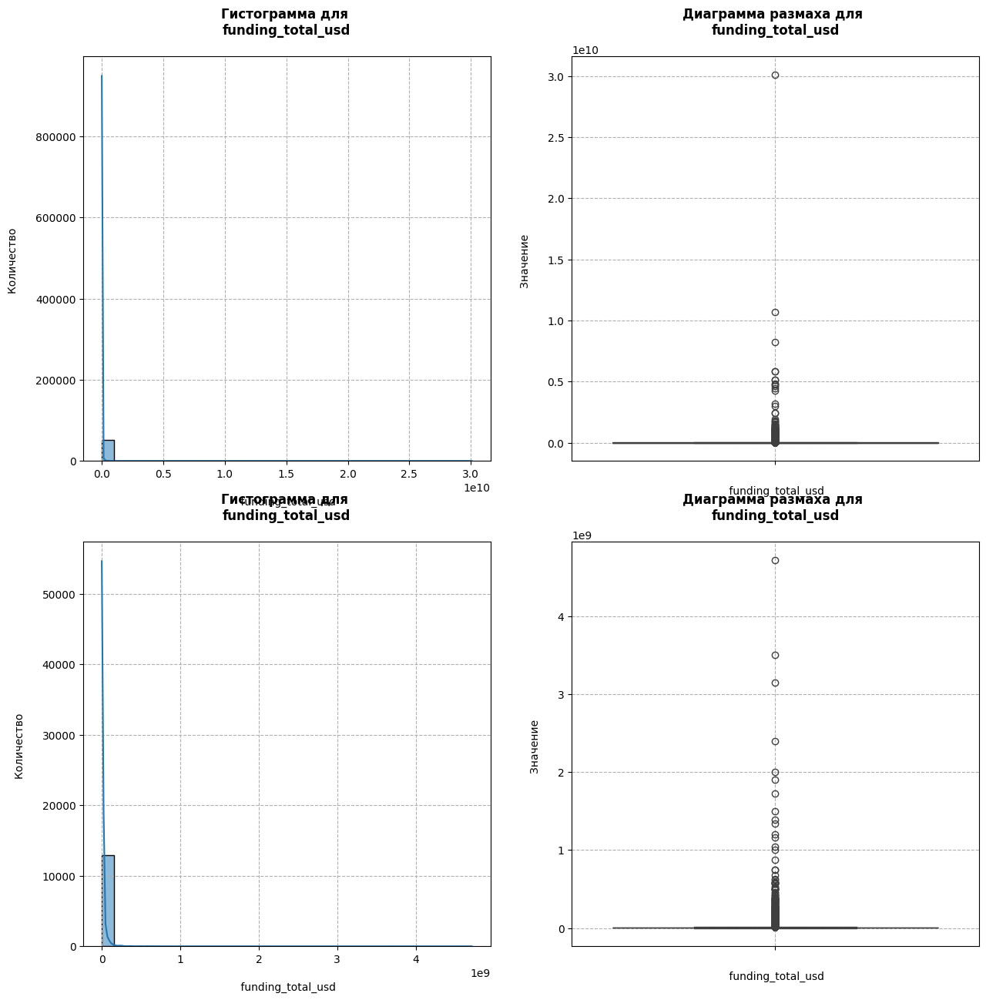

In [ ]:
fig, axs = plt.subplots(2, 2, sharex=False, sharey=False, figsize=(15, 15))

sns.histplot(df_train['funding_total_usd'], bins=30, kde=True, ax=axs[0, 0])
axs[0, 0].ticklabel_format(axis='x')
axs[0, 0].set_xlabel('\n ' + 'funding_total_usd')
axs[0, 0].set_ylabel('Количество \n')
axs[0, 0].set_title('Гистограмма для \n' + 'funding_total_usd' + '\n', 
                    color='black', fontweight ='bold')
axs[0, 0].grid(linestyle='--')

sns.boxplot(y=df_train['funding_total_usd'], ax=axs[0, 1])
axs[0, 1].ticklabel_format(axis='y')
axs[0, 1].set_xlabel('\n ' + 'funding_total_usd')
axs[0, 1].set_ylabel('Значение \n')
axs[0, 1].set_title('Диаграмма размаха для \n' + 'funding_total_usd' + '\n', 
                    color='black', fontweight ='bold')
axs[0, 1].grid(linestyle='--')

sns.histplot(df_test['funding_total_usd'], bins=30, kde=True, ax=axs[1, 0])
axs[1, 0].ticklabel_format(axis='x')
axs[1, 0].set_xlabel('\n ' + 'funding_total_usd')
axs[1, 0].set_ylabel('Количество \n')
axs[1, 0].set_title('Гистограмма для \n' + 'funding_total_usd' + '\n', 
                    color='black', fontweight ='bold')
axs[1, 0].grid(linestyle='--')

sns.boxplot(y=df_test['funding_total_usd'], ax=axs[1, 1])
axs[1, 1].ticklabel_format(axis='y')
axs[1, 1].set_xlabel('\n ' + 'funding_total_usd')
axs[1, 1].set_ylabel('Значение \n')
axs[1, 1].set_title('Диаграмма размаха для \n' + 'funding_total_usd' + '\n', 
                    color='black', fontweight ='bold')
axs[1, 1].grid(linestyle='--')

Распределение признаков количественных показателей lifetime, funding_rounds и funding_total_usd в зависимости от статуса стартапа

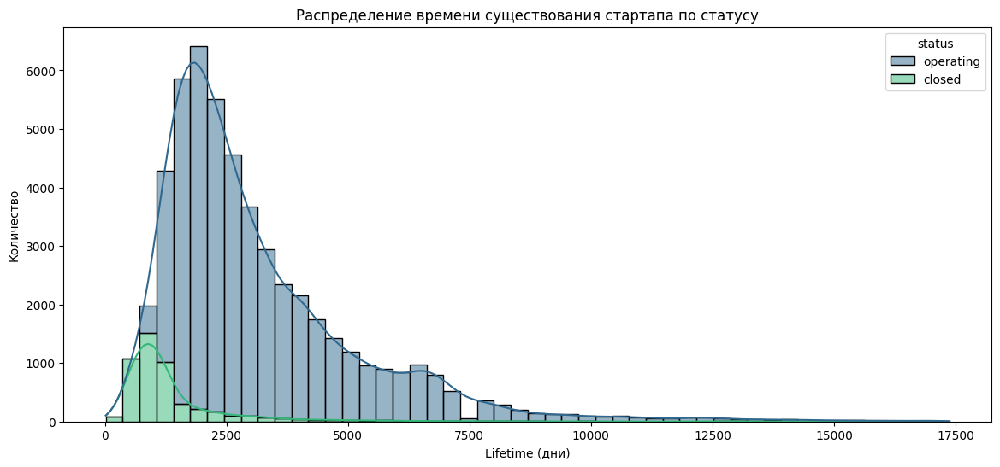

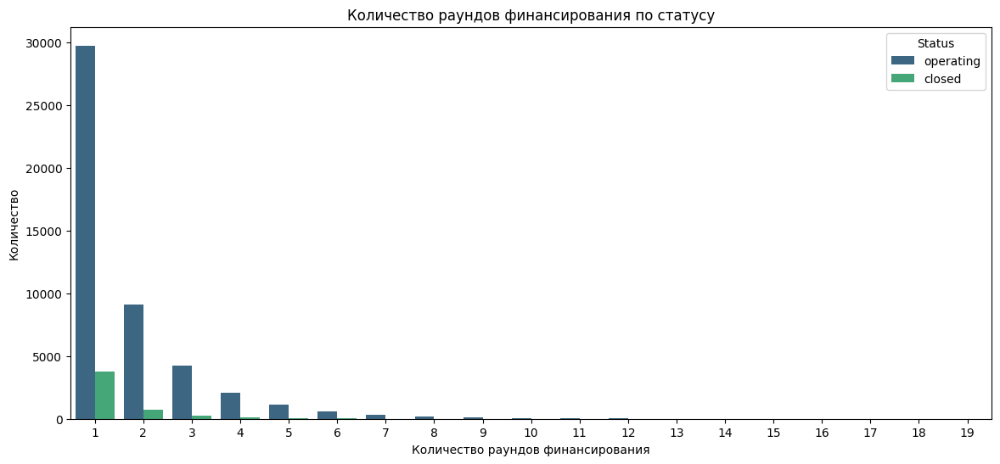

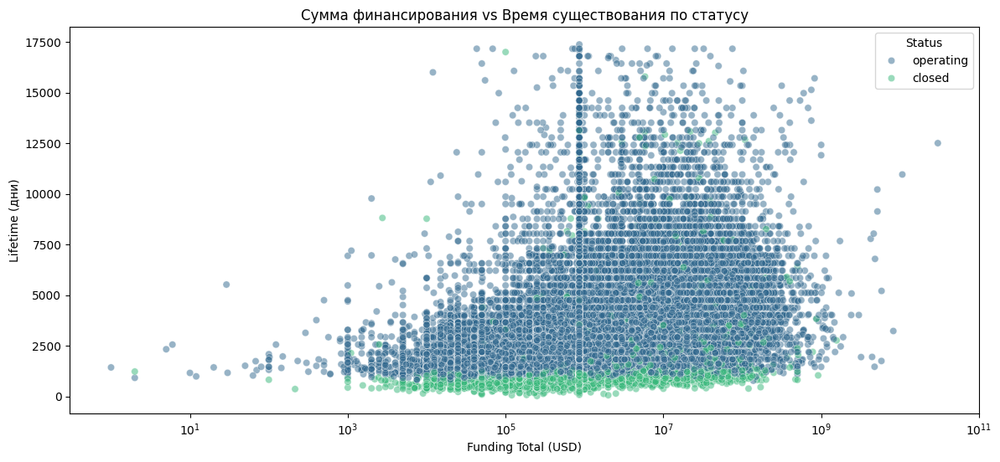

In [ ]:
plt.figure(figsize=(14,6))
sns.histplot(data=df_train, x='lifetime', bins=50, kde=True, hue='status', multiple='stack', palette='viridis')
plt.title('Распределение времени существования стартапа по статусу')
plt.xlabel('Lifetime (дни)')
plt.ylabel('Количество')
plt.show()

# Количество раундов финансирования
plt.figure(figsize=(14,6))
sns.countplot(x='funding_rounds', data=df_train, hue='status', palette='viridis')
plt.title('Количество раундов финансирования по статусу')
plt.xlabel('Количество раундов финансирования')
plt.ylabel('Количество')
plt.legend(title='Status')
plt.show()

# Общая сумма финансирования vs Время существования
plt.figure(figsize=(14,6))
sns.scatterplot(data=df_train, x='funding_total_usd', y='lifetime', hue='status', alpha=0.5, palette='viridis')
plt.title('Сумма финансирования vs Время существования по статусу')
plt.xlabel('Funding Total (USD)')
plt.ylabel('Lifetime (дни)')
plt.xscale('log')  # Логарифмическая шкала из-за высоких значений
plt.legend(title='Status')
plt.show()

Корреляции среди призаков у действующих стартапов

<>:43: SyntaxWarning: invalid escape sequence '\p'
<>:43: SyntaxWarning: invalid escape sequence '\p'
C:\Users\TIMUR\AppData\Local\Temp\ipykernel_8760\3474280630.py:43: SyntaxWarning: invalid escape sequence '\p'
  ax.set_title('Корреляция $\phi_K$ (status "operating")\n')


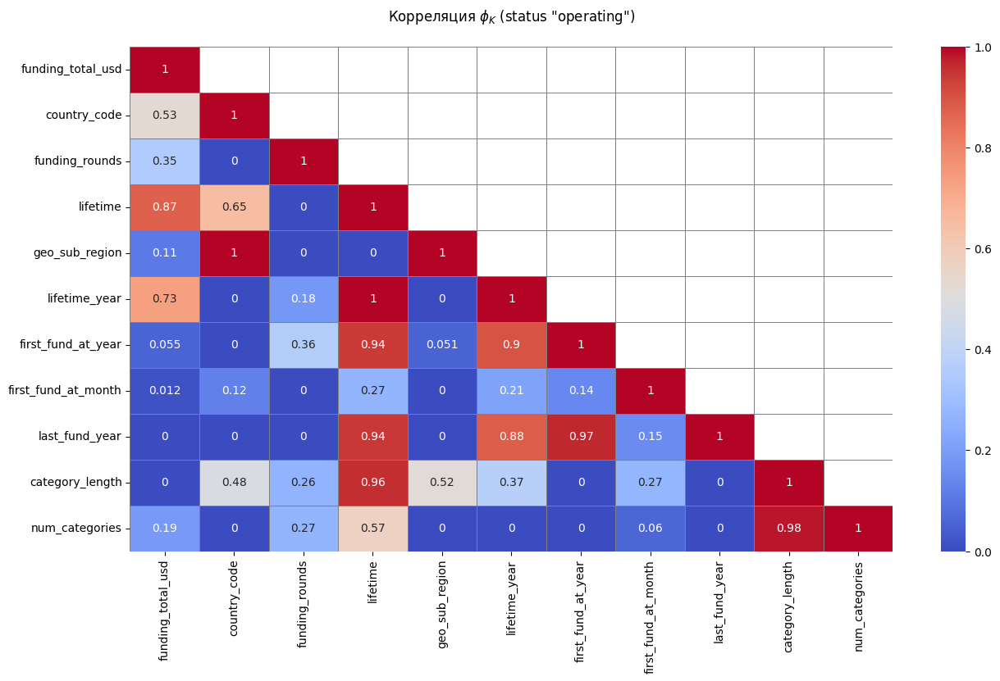

In [ ]:
# создаю переменную со списком непрерывных признаков
interval_cols = ['funding_total_usd']

# создаю переменную с результатами корреляционного анализа
check_corr = (df_train
              .query('status == "operating"')
              .drop([
                  'name', 
                  'status',
                  'category_list', 
                  'state_code', 
                  'region', 
                  'city', 
                  'founded_at', 
                  'first_funding_at', 
                  'last_funding_at', 
                  'closed_at'
              ], axis=1)
              .sample(1000)
              .phik_matrix(interval_cols=interval_cols)
             )

# создаю тепловую карту корреляционного анализа
fig, ax = plt.subplots(figsize=(15, 8))

# создаю маски для отображения нижнего "треугольника зависимостей" и основной диагонали
mask = np.triu(np.ones_like(check_corr))
mask[np.diag_indices_from(mask)] = False

sns.heatmap(
    check_corr,
    annot=True,
    fmt='.2g',
    vmin=0,
    vmax=1,
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='grey',
    square=False,
    mask=mask,
    ax=ax
    )
ax.set_title('Корреляция $\phi_K$ (status "operating")\n')

plt.show()

Корреляции среди признаков у закрытых стартапов

<>:43: SyntaxWarning: invalid escape sequence '\p'
<>:43: SyntaxWarning: invalid escape sequence '\p'
C:\Users\TIMUR\AppData\Local\Temp\ipykernel_8760\2137470921.py:43: SyntaxWarning: invalid escape sequence '\p'
  ax.set_title('Корреляция $\phi_K$ (status "closed")\n')


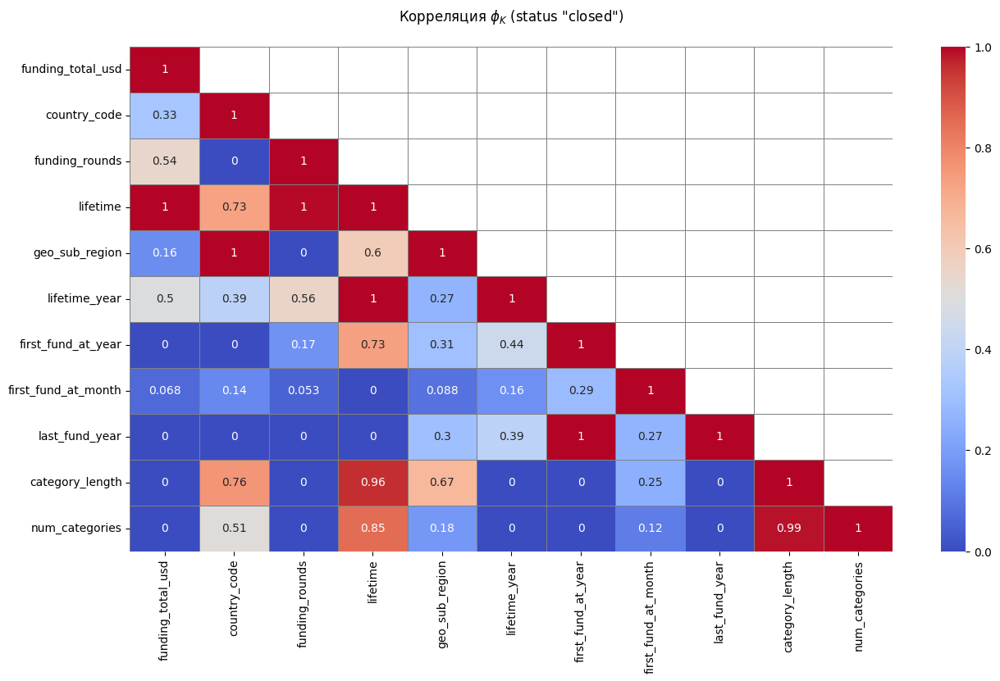

In [ ]:
# создаю переменную со списком непрерывных признаков
interval_cols = ['funding_total_usd']

# создаю переменную с результатами корреляционного анализа
check_corr = (df_train
              .query('status == "closed"')
              .drop([
                  'name', 
                  'status',
                  'category_list', 
                  'state_code', 
                  'region', 
                  'city', 
                  'founded_at', 
                  'first_funding_at', 
                  'last_funding_at', 
                  'closed_at'
              ], axis=1)
              .sample(1000)
              .phik_matrix(interval_cols=interval_cols)
             )

# создаю тепловую карту корреляционного анализа
fig, ax = plt.subplots(figsize=(15, 8))

# создаю маски для отображения нижнего "треугольника зависимостей" и основной диагонали
mask = np.triu(np.ones_like(check_corr))
mask[np.diag_indices_from(mask)] = False

sns.heatmap(
    check_corr,
    annot=True,
    fmt='.2g',
    vmin=0,
    vmax=1,
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='grey',
    square=False,
    mask=mask,
    ax=ax
    )
ax.set_title('Корреляция $\phi_K$ (status "closed")\n')

plt.show()

### Выводы по итогам EDA



1. У признака funding_total_usd большое количество выбросов. 95% процентиль и в тестовом и в тренировочном датасете на уровне 53-56 млн долл. Однако есть строки с несколькими миллиардами инвестиций. Отметим уровень в 100 млн долл как уровень, после которого начинаются выбросы и удалим эти строки из тренировочного датасета.

In [ ]:
df_train = df_train.query('funding_total_usd < 100000000')

2. Портрет типичного закрывшегося стартапа:
- просуществовал менее 1000 суток;
- получил 1 - реже 2 раунад финансирования. После 4 раунда доля закрывшихся стартапов исчезающе мала.
3. Основная часть стартапов получила небольшой объем финансирования. Это говорит о том, что либо после этого стартап не смог продолжить свою деятельнсть и оказался нежизнеспособен, либо наобоорот преодолел точку безубыточности и смог заществовать за счет своей прибыли.
4. Существенное количество стартапов стало появляться только после 2000 года, после 2010 количество стало резко повышаться. Распределение раундов финансирования показывает аналогичную тенденцию.
5. Наиболее распространенным регионом является Северная Америка и Западная Европа.
6. Уровень финансирования положительно влияет на продолжительность существования стартапа.
7. У закрывшихся стартапов наблюдается сильная связь между показателями продолжительности жизни и количества раундов финансирования и объема финансирования.
8. У действующих стартапов в отличие от закрывшихся есть сввязь между количеством сфер деятельности и продолжительность существования. То есть такие стартапы более устойчивы.

В целом картина по результатам EDA соответствует общим представлениям о стартапах: высококонкурентная среда, "плавильный котел", в котором значительная часть стартапов закрывается на ранних этапах уществования, но пережим отметку 2 раунда финансирования или 3 года жизни, как правильно, продолжает свою деятельность. 

Наиболее ерспективными признаками для МЛ представляются:
- lifetime;
- funding_total_usd;
- first_fund_at_year.

### Мультиколлинеарность

Не выявлено признаков обладающих чрезмерн высоким уровнем влияния на целевой признак.

Наиболее влиятельным является признак lifetime, но его Ккорр составляет всего 0,41.

Вместе с тем целесообразно оставить один признак, отражающий географическую привязку стартапа, потому что очевидно, что зависимость между городами, странами и регионами будет высокой.

## Подготовка данных

In [ ]:
# Определение признаков и целевой переменной
X = df_train.drop(['status', 'first_fund_at_month','name', 'founded_at','country_code', 'first_funding_at', 'lifetime_year','last_funding_at', 'closed_at','category_list','city','region','state_code'], axis=1)
y = df_train['status'] 

#X_test = df_test.drop(['name', 'first_fund_at_month','first_funding_at','country_code', 'last_funding_at', 'lifetime_year','category_list','city','region','state_code'], axis=1)
#y_test = df_sample['status'] 
 

In [ ]:
X_train_1, X_test_val, y_train_1, y_test_val = train_test_split(X, y,
                                                                test_size=0.3,
                                                                random_state=RANDOM_STATE,
                                                                stratify=y)

In [ ]:
label_encoder = LabelEncoder()

y_train_1 = label_encoder.fit_transform(y_train_1)
y_test_val = label_encoder.transform(y_test_val)

In [ ]:
display(pd.DataFrame(data=label_encoder.classes_, columns=['quit']))

,quit
0,closed
1,operating


In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51206 entries, 0 to 52515
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   funding_total_usd   51206 non-null  float64
 1   funding_rounds      51206 non-null  int64  
 2   lifetime            51206 non-null  int64  
 3   geo_sub_region      51206 non-null  object 
 4   first_fund_at_year  51206 non-null  int64  
 5   last_fund_year      51206 non-null  int64  
 6   category_length     51206 non-null  int64  
 7   num_categories      51206 non-null  int64  
dtypes: float64(1), int64(6), object(1)
memory usage: 3.5+ MB


In [ ]:
num_columns = [
    'lifetime',
    'funding_rounds', 
    'funding_total_usd', 
    'first_fund_at_year',
    'category_length',
    'num_categories',
    'last_fund_year'
]
ohe_columns = ['geo_sub_region']

## Обучение модели

In [ ]:
ohe_pipe = Pipeline(
    [('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
    ]
)

In [ ]:
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('num', StandardScaler(), num_columns)
    ], 
    remainder='passthrough'
)

In [ ]:
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
])

In [ ]:
param_grid = [
     {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(2,5),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']   
    },

    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2,10),
        'models__max_features': range(2, 10),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    },
    #{
     #   'models':[RandomForestClassifier(random_state=RANDOM_STATE)],
    #    'models__n_estimators': [10, 20],
    #    'models__max_depth': [10, None],
    #    'models__min_samples_split': [2, 3],
    #    'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passth
    {
        'models':[GradientBoostingClassifier(random_state=RANDOM_STATE)],
        'models__n_estimators': [20, 50],
        'models__learning_rate': [0.01, 0.1],
        'models__max_depth': [2, 5],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough'] 
    },
    {
        'models':[cb.CatBoostClassifier(verbose=0, random_state=RANDOM_STATE)],
        'models__iterations': [20, 50],
        'models__learning_rate': [0.01, 0.1],
        'models__depth': [6, 10],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough'] 
    },
    {
        'models':[LogisticRegression(max_iter=1000, random_state=RANDOM_STATE)],
        'models__C': [0.1, 1, 10],
        'models__penalty': ['l2'],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough'] 
    },
    {
        'models':[xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=RANDOM_STATE)],
        'models__n_estimators': [2, 5],
        'models__learning_rate': [0.01, 0.1],
        'models__max_depth': [2, 5],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough'] 
    }
    
]

In [ ]:
randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_grid, 
    cv=5,
    scoring='f1',
    random_state=RANDOM_STATE,
    n_jobs=-1
)

In [ ]:
bm = randomized_search.fit(X_train_1, y_train_1)

In [ ]:
print('Лучшая модель и её параметры:\n\n', bm.best_estimator_)
print(f'Параметры лучшей модели:\n{bm.best_params_}')
print ('Метрика лучшей модели на тренировочной выборке:', round(bm.best_score_, 4))

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['geo_sub_region']),
                                                 ('num', StandardScaler(),
                                                  ['lifetime', 'funding_rounds',
             

8 лучших моделей

In [ ]:
result = pd.DataFrame(randomized_search.cv_results_)
print(result[
    ['rank_test_score', 'param_models', 'mean_test_score','params']
].sort_values('rank_test_score'))

   rank_test_score                                       param_models  \
1                1  <catboost.core.CatBoostClassifier object at 0x...   
2                2           DecisionTreeClassifier(random_state=100)   
3                3           DecisionTreeClassifier(random_state=100)   
9                4  <catboost.core.CatBoostClassifier object at 0x...   
4                5  <catboost.core.CatBoostClassifier object at 0x...   
6                5  <catboost.core.CatBoostClassifier object at 0x...   
0                7           DecisionTreeClassifier(random_state=100)   
7                8           DecisionTreeClassifier(random_state=100)   
5                9           DecisionTreeClassifier(random_state=100)   
8               10           DecisionTreeClassifier(random_state=100)   

   mean_test_score                                             params  
1             0.99  {'preprocessor__num': StandardScaler(), 'model...  
2             0.98  {'preprocessor__num': StandardSc

Лучшая модель

bm

## Анализ важности показателей

In [ ]:
y_test_pred = randomized_search.predict(X_test_val)
y_test_proba = randomized_search.predict_proba(X_test_val)
print(f'Метрика f1 на тестовой выборке: {f1_score(y_test_val, y_test_pred)}')

Метрика f1 на тестовой выборке: 0.9870546699475767


In [ ]:
thresholds = [round(i,2) for i in np.linspace(0.1, 1, num = 50, endpoint=False)]
# создаю пустые списки для сохранение промежуточных значений метрик
col_threshold=[]
col_f1_score=[]

# циклом рассчитываю метрики при разных значениях порога
for i in thresholds:
    # определяю принадлежность классам на основе порога
    proba = (y_test_proba[:, 1] >= i).astype(int)

    # вношу значения метрик в списки
    col_threshold.append(i)
    col_f1_score.append(round(f1_score(y_test_val, proba), 5))

    # завершаю работу цикла, если f1 стала равна 100%
    if f1_score(y_test_val, proba) == 1:
        break

pd.options.display.float_format ='{:,.5f}'.format

# помещаю результаты в датафрейм и вывожу результаты на экран
result = pd.DataFrame({'Threshold' : col_threshold, 
                      'F1-score' : col_f1_score
                     })

# вывожу 5 лучших результатов на экран с сортировкой по убыванию
display(result
        .sort_values(by='F1-score', ascending=False)
        .head(10)
)
# вывожу 5 лучших результатов на экран с сортировкой по убыванию
display(result
        .sort_values(by='F1-score', ascending=False)
        .tail(10)
)

pd.options.display.float_format ='{:,.2f}'.format

,Threshold,F1-score
26,0.57000,0.98747
30,0.64000,0.98739
25,0.55000,0.98737
27,0.59000,0.98733
28,0.60000,0.98729
29,0.62000,0.98728
31,0.66000,0.98723
24,0.53000,0.98716
20,0.46000,0.98706
32,0.68000,0.98705


,Threshold,F1-score
42,0.86000,0.98375
1,0.12000,0.98354
43,0.87000,0.98346
0,0.10000,0.98281
44,0.89000,0.98253
45,0.91000,0.97997
46,0.93000,0.97721
47,0.95000,0.96917
48,0.96000,0.96006
49,0.98000,0.86380


In [ ]:
X_train_2 = pipe_final.named_steps['preprocessor'].fit_transform(X_train_1)

rf_explainer = shap.Explainer(randomized_search.best_estimator_.named_steps['models'], X_train_2)

X_test_2 = pipe_final.named_steps['preprocessor'].transform(X_test_val)
feature_names = pipe_final.named_steps['preprocessor'].get_feature_names_out()

X_test_2 = pd.DataFrame(X_test_2, columns=feature_names)
rf_shap_values = rf_explainer(X_test_2)

 99%|===================| 15226/15362 [01:26<00:00]        

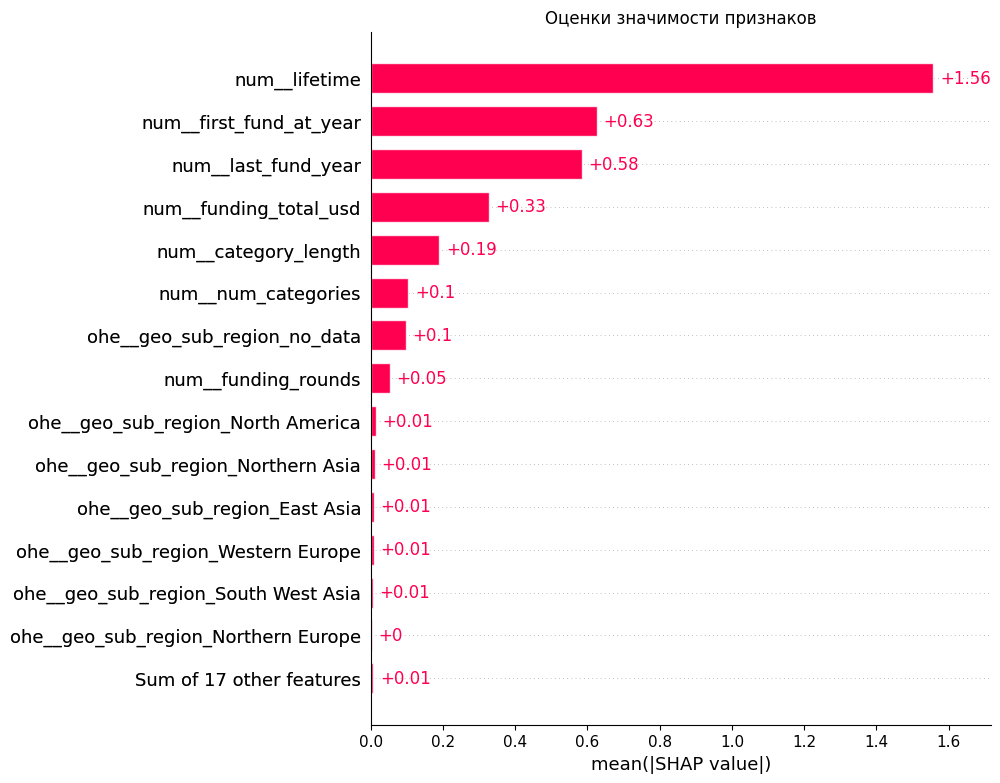

None

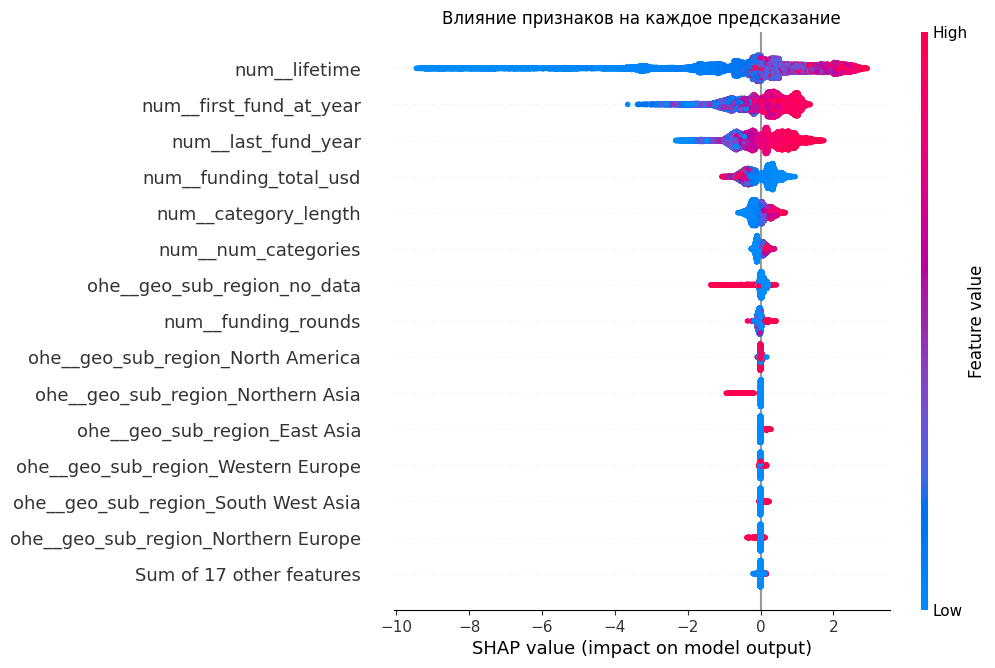

In [ ]:
plt.title('Оценки значимости признаков')

display(shap.plots.bar(rf_shap_values, max_display=15))

plt.title('Влияние признаков на каждое предсказание')
shap.plots.beeswarm(rf_shap_values, max_display=15)
plt.show()

По результатам моделирования наиболее влиятельными признаками оказались:
- lifetime (прямая зависимость);
- first_fund_at_year (прямая зависимость);
- last_fund_year (прямая зависимость). \
В целом соответствует предположениям на этапе EDA.

In [ ]:
r = {'y_test': y_test_val, 'y_test_pred': y_test_pred, 'y_test_proba': y_test_proba[:,1]}
res_test = pd.DataFrame(data = r)
res_test.sort_values(by = 'y_test_proba', ascending = False).sample(10)

,y_test,y_test_pred,y_test_proba
922,0,0,0.03
15143,0,0,0.20
8538,1,1,1.00
8541,1,1,1.00
5073,1,1,0.99
6748,1,1,0.99
3449,1,1,0.98
11987,1,1,0.97
14512,0,0,0.26
11646,1,1,0.98


## Итоговый отчет

1. Поставленная задача предполагала разработку модели машинного обучения для прогнозирования банкротства стартапов и исследовательский анализ данных, позволяющий выявить зависимости и факторы, влияющие на закрытие стартапов.
Были предоставлены два датасета: тренировочный (52к строк) и тестовый (12к строк). Между датасетам есть небольшая разница в структуре признаков. В итоге на этапе предобработки оба датасета были приведены к одинаковому виду.
2. В процессе предобработки:
- исправлена типизация некоторых столбцов;
- все пропуски были обработаны и заполнены;
- явных дубликатов не обнаружено;
- добавлены новые признаки, характеризующие: количество категорий бизнеса, к которым относится стартап, год и месяц первой и последней даты получения инвестиций, укрупненная географическая привызка нахождения стартапа, количество лет существования стартапа;
- были удалены строки с объемом финансирования свыше 100 млн долл как выбросы.
3. В процессе исследовательского анализа выяснилось:
- типичный закрывшийся стартап просущетвовал менее 3 лет и имел 1-2 раунда финансирования, специализировался на малом (скорее всего одной) отрасли бизнеса;
- основная часть стартапов получила относительно небольшое финансирование;
- несмтря на то, что данные начинаются с 1970, заметной доля стартапов стала только с 2000 года, с 2010 года начался быстрый рост их количества, что связано с общим прогрессом в экономике;
- главным регионом появления стартапов является регион Северной Америки и Западной Европы;
- выявлено, что для машинного бучения наиболее ерспективными призхнаками являются lifetime, funding_total_usd, first_fund_at_year.
4. Для выбора наилечшей модели выбран пайплан, кодировка целевого признака осуществлена с помощью LabelEncoder.
5. В пайплан загружены следующие модели: KNeighborsClassifier, DecisionTreeClassifier, GradientBoostingClassifier, CatBoostClassifier, LogisticRegression, XGBClassifier. Поиск гиперпараметров осуществлялся посредством RandomizedSearchCV. В качестве метрики по условиям задачи была метрика f1.
6. Лучший результат показала модель CatBoostClassifier с параметрами 'models__learning_rate': 0.1, 'models__iterations': 50, 'models__depth': 10.\
На тренировочной выборке метрика f1 составила 0.9876, на тестовой 0.9870.
7. Для анализа значимости признаков для прогноза была использована библиотека shap, которая продемонстрировала, что наиболее важными показателями являются:
- lifetime (прямая зависимость);
- first_fund_at_year (прямая зависимость);
- last_fund_year (прямая зависимость). \
8. Проведенный анализ позволил сформулировать ряд рекомендаций для повышения щансов на продолжительное существование стартапа:
- стартап должен быть создан на стыке как можно большего числа отраслей;
- в странах с большим рынком и развитой финансовой системой;
- при создании стартапа рассчитывать финансирования минимум на 3 год, т.к. это самый критический отрезок времени, в котором происходит большая часть банкротств.